In [1]:
import torchvision
import torch.nn as nn
import torch
import torch.nn.functional as F
from torchvision import transforms,models,datasets
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from torch import optim

In [2]:
train_data_dir = 'dogs-vs-cats/train/train' 
 
transform = transforms.Compose([transforms.Resize(255), 
    transforms.CenterCrop(224), 
    transforms.ToTensor()]) 
 
dataset = torchvision.datasets.ImageFolder(train_data_dir, transform= transform) 
train_loader = torch.utils.data.DataLoader(dataset, batch_size=400 ,shuffle=True) 

test_data_dir = 'dogs-vs-cats/train/test' 
 
transform = transforms.Compose([transforms.Resize(255), 
    transforms.CenterCrop(224), 
    transforms.ToTensor()]) 
 
test_dataset = torchvision.datasets.ImageFolder(test_data_dir, transform= transform) 
test_loader = torch.utils.data.DataLoader(dataset, batch_size=400 ,shuffle=True)

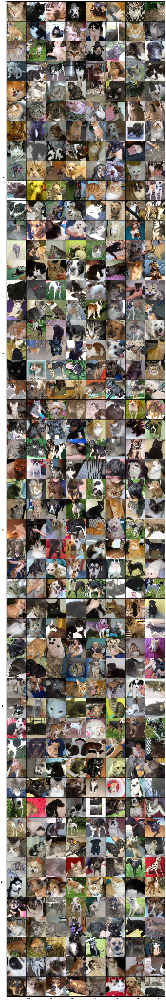

In [3]:
def imshow(inp, title=None): 
    """Imshow for Tensor.""" 
    inp = inp.numpy().transpose((1, 2, 0)) 
    plt.figure(figsize=(20,150)) 
    plt.imshow(inp) 
 
inputs, classes = next(iter(train_loader)) 
 
# Make a grid from batch 
out = torchvision.utils.make_grid(inputs, scale_each= True) 
 
imshow(out) 
 

In [4]:
model = models.densenet121(pretrained = True) 
model

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [5]:
for params in model.parameters(): 
    params.requires_grad = False 

from collections import OrderedDict 
 
classifier = nn.Sequential(OrderedDict([ 
    ('fc1',nn.Linear(1024,500)), 
    ('relu',nn.ReLU()), 
    ('fc2',nn.Linear(500,2)), 
    ('Output',nn.LogSoftmax(dim=1)) 
])) 
 
model.classifier = classifier

Train the model.

In [ ]:
#model = model.cuda() 
optimizer= optim.Adam(model.classifier.parameters()) 
criterian= nn.NLLLoss() 
list_train_loss=[] 
list_test_loss=[] 
 
for epoch in range(10): 
    train_loss= 0 
    test_loss= 0 
    for bat,(img,label) in enumerate(train_loader): 
        # moving batch and labels to gpu 
        img = img 
        label = label 
        model.train() 
        optimizer.zero_grad() 
 
        output = model(img) 
        loss = criterian(output,label) 
        loss.backward() 
        optimizer.step() 
        train_loss = train_loss+loss.item() 
 
    accuracy=0 
    for bat,(img,label) in enumerate(test_loader): 
        img = img
        label = label 
        model.eval() 
        logps= model(img) 
        loss = criterian(logps,label) 
        test_loss+= loss.item() 
        ps=torch.exp(logps) 
        top_ps,top_class=ps.topk(1,dim=1) 
        equality=top_class == label.view(*top_class.shape) 
        accuracy +=torch.mean(equality.type(torch.FloatTensor)).item() 
 
    list_train_loss.append(train_loss/20) 
    list_test_loss.append(test_loss/20) 
    print('epoch: ',epoch,' train_loss: ',train_loss/20,' test_loss: ',test_loss/20,' accuracy: ', accuracy/len(test_loader)) 

In [ ]:
samples, _ = iter(test_loader).next() 
samples = samples
fig = plt.figure(figsize=(24, 16)) 
fig.tight_layout() 
output = model(samples[:24]) 
pred = torch.argmax(output, dim=1) 
pred = [p.item() for p in pred] 
ad = {0:'I guess it\'s a cat', 1:'I guess it\'s a dog'} 
for num, sample in enumerate(samples[:24]): 
    plt.subplot(4,6,num+1) 
    plt.title(ad[pred[num]]) 
    plt.axis('off') 
    sample = sample.cpu().numpy() 
    plt.imshow(np.transpose(sample, (1,2,0))) 

In [ ]:
import matplotlib.pyplot as plt 
figs , ax = plt.subplots(1,2,figsize=(20,5)) 
ax[0].plot(list_test_loss) 
ax[0].set_title('test_loss') 